# This is the publishing finalized version of applying DetectroRS to 2D hbN material (09.08.22)
For training on 2D material images, DetectoRS algorithm is chosen with Cascade+ResNet-50 as the backbone detector architecture implemented in MMDetection library.



In MMDetection Library:

- To be able to see the number of detections (instead of percentage) in confusion matrix, in confusion matrix.py in line 166, comment below:

  per_label_sums * 100

- You can aslo change the fig size in confusion matrix code in line 170 (change both 0.5 to 1) to make the confusion matrix axes bigger:

   figsize=(0.5 * num_classes, 0.5 * num_classes * 0.8, dpi=180) 

In [ ]:
#### Installation 

# install dependencies: (use cu111 because colab has CUDA 11.1)
# install PyTorch and torchvision 
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
# !pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html
!pip install mmcv-full==1.6.0 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html # the above line install the latest version, and after some time using the latest version, I one day recieved an error that i should reduce the version of mmcv to be compatible


# install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |█████████████                   | 834.1 MB 1.2 MB/s eta 0:16:49tcmalloc: large alloc 1147494400 bytes == 0x399f2000 @  0x7fb89851b615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |████████████████▌               | 1055.7 MB 1.2 MB/s eta 0:13:40tcmalloc: large alloc 1434370048 bytes == 0x7e048000 @  0x7fb89851b615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |█████

In [ ]:
#### Check the Installation 
from mmcv import collect_env
collect_env()

# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.9.0+cu111 True
2.25.1
11.1
GCC 7.3


In [ ]:
#### Importing the pre-trained weights from the workspace (you need to upload it to the workspace first)
import zipfile
with zipfile.ZipFile('/content/epoch18.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/epoch18/')

In [ ]:
#### Importing our own dataset
import zipfile
with zipfile.ZipFile('/content/sample_data/MonArk_BN_Modified_Classes.v6i.coco.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/sample_data/our_data/')

In [ ]:
### Applying the trained model on three test dataset and plot confusion matrix.

# Our own test data Inference and Confusion Matrix
#create a directory to save the results, and extract the data
!mkdir /content/mat1 # creating a folder to save the confusion matrix in 

# Doing the inference on test data, save the results and also images, calculating the confusion matrix
!python tools/test.py /content/mmdetection/configs/my_custom_detectroRS_config.py /content/epoch18/epoch_18.pth --out /content/our_results1.pkl --show-dir /content/mat1
!python tools/analysis_tools/confusion_matrix.py /content/mmdetection/configs/my_custom_detectroRS_config.py /content/our_results1.pkl /content/mat1 --show 


mkdir: cannot create directory ‘/content/mat1’: File exists
/content/mmdetection/mmdet/utils/setup_env.py:39: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  f'Setting OMP_NUM_THREADS environment variable for each process '
/content/mmdetection/mmdet/utils/setup_env.py:49: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  f'Setting MKL_NUM_THREADS environment variable for each process '
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
load checkpoint from local path: /content/epoch18/epoch_18.pth
[                                                  ] 0/10, elapsed: 0s, ETA:/usr/local/lib/python3.7/dist-packages

In [ ]:
# Masubuchi test data Inference and Confusion Matrix

#create a directory to save the results, and extract the data
!mkdir /content/mat2

with zipfile.ZipFile('/content/sample_data/Masubuchi_Object_Detection.v5i.coco.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/sample_data/Mas_data/')

# Doing the inference on test data, save the results and also images, calculating the confusion matrix
!python tools/test.py /content/mmdetection/configs/my_custom_detectroRS_config_masubuchi.py /content/epoch18/epoch_18.pth --out /content/Mas_results1.pkl --show-dir /content/mat2
!python tools/analysis_tools/confusion_matrix.py /content/mmdetection/configs/my_custom_detectroRS_config_masubuchi.py /content/Mas_results1.pkl /content/mat2 --show


/content/mmdetection/mmdet/utils/setup_env.py:39: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  f'Setting OMP_NUM_THREADS environment variable for each process '
/content/mmdetection/mmdet/utils/setup_env.py:49: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  f'Setting MKL_NUM_THREADS environment variable for each process '
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
load checkpoint from local path: /content/epoch18/epoch_18.pth
[                                                  ] 0/10, elapsed: 0s, ETA:/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and 

In [ ]:
# UA test data Inference and Confusion Matrix

#create a directory to save the results, and extract the data
!mkdir /content/mat3

with zipfile.ZipFile('/content/sample_data/UA_BN_Dataset.v5i.coco.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/sample_data/UA_data/')

# Doing the inference on test data, save the results and also images, calculating the confusion matrix
!python tools/test.py /content/mmdetection/configs/my_custom_detectroRS_config_UA.py /content/epoch18/epoch_18.pth --out /content/UA_results1.pkl --show-dir /content/mat3
!python tools/analysis_tools/confusion_matrix.py /content/mmdetection/configs/my_custom_detectroRS_config_UA.py /content/UA_results1.pkl /content/mat3 --show


mkdir: cannot create directory ‘/content/mat3’: File exists
/content/mmdetection/mmdet/utils/setup_env.py:39: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  f'Setting OMP_NUM_THREADS environment variable for each process '
/content/mmdetection/mmdet/utils/setup_env.py:49: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  f'Setting MKL_NUM_THREADS environment variable for each process '
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
load checkpoint from local path: /content/epoch18/epoch_18.pth
[                                                  ] 0/10, elapsed: 0s, ETA:/usr/local/lib/python3.7/dist-packages

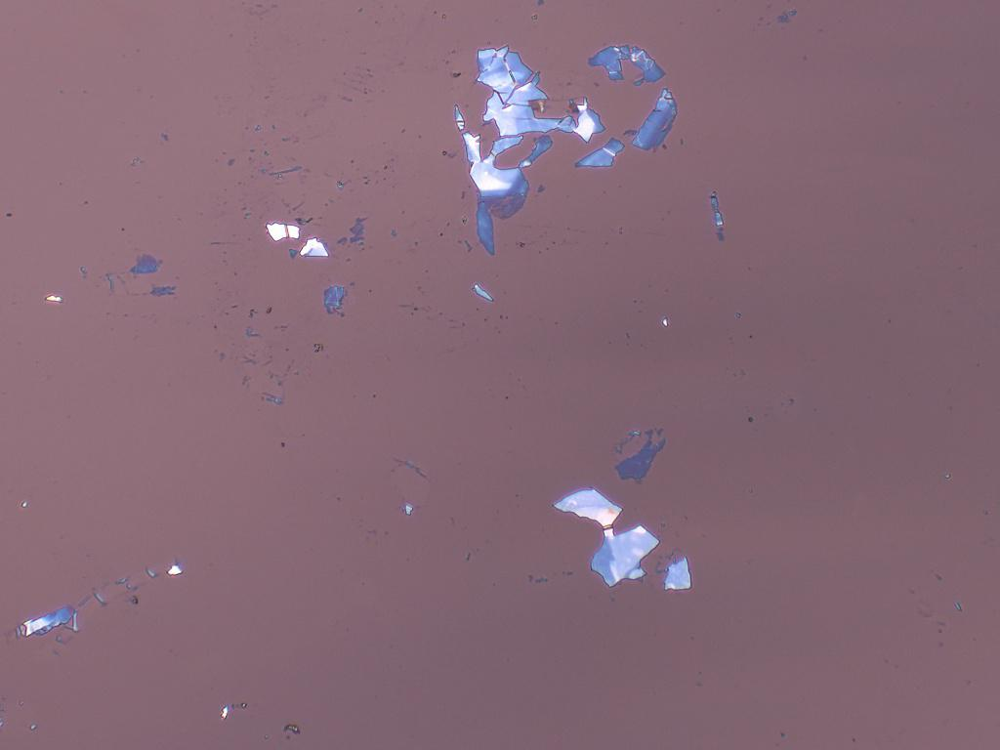

load checkpoint from local path: /content/epoch18/epoch_18.pth


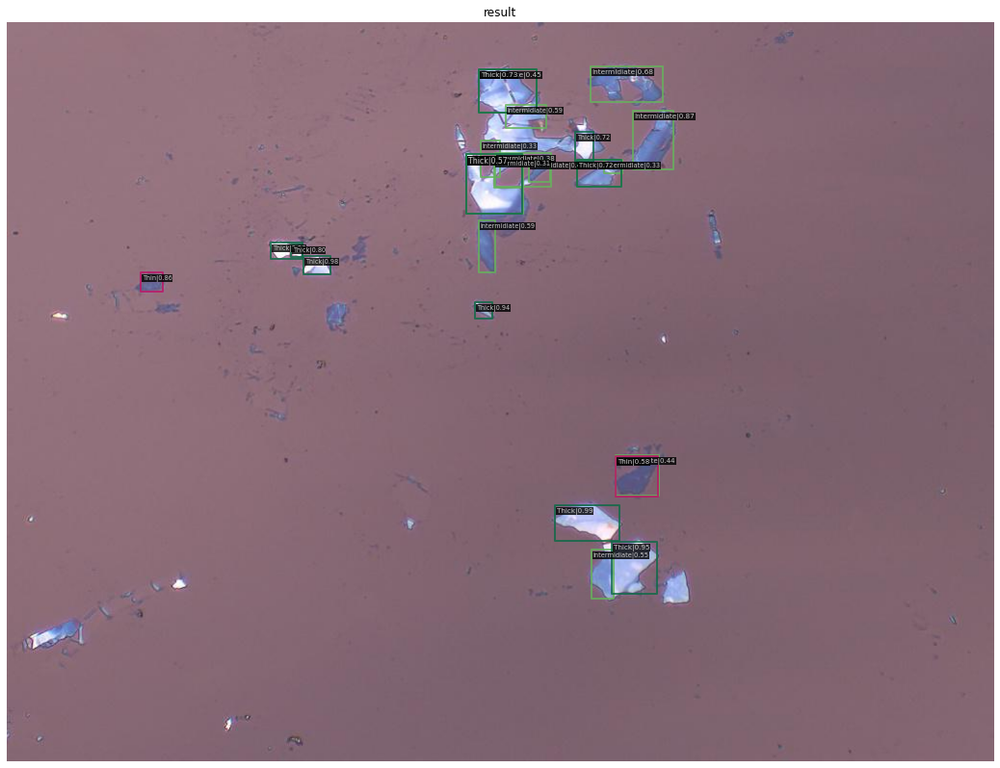

In [ ]:
#### Inference with the saved pre-trained weights and configuration 
import mmcv
from mmcv import Config
from mmcv.runner import load_checkpoint
from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector


# Make the checkpoints
config_path='/content/mmdetection/configs/my_custom_detectroRS_config.py'
load_path='/content/epoch18/epoch_18.pth'

#load the config
cfg = Config.fromfile(config_path)  
cfg.load_from = load_path

# run detection for a single image from our dataset:
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
from google.colab.patches import cv2_imshow
from skimage.io import imread_collection

image=mmcv.imread('/content/sample_data/our_data/test/220324-hBN-on-100nm-SiO2-SP-1_17_jpg.rf.e66e6c2c19cc7bcaa8c0e2b8e6df781f.jpg')
cv2_imshow(image)

model = init_detector(cfg, load_path, device='cuda:0')
# change the name of classes for visualization purpose
model.CLASSES=('Intermidiate','Thick','Thin') 
result = inference_detector(model, image)
show_result_pyplot(model, image, result) 


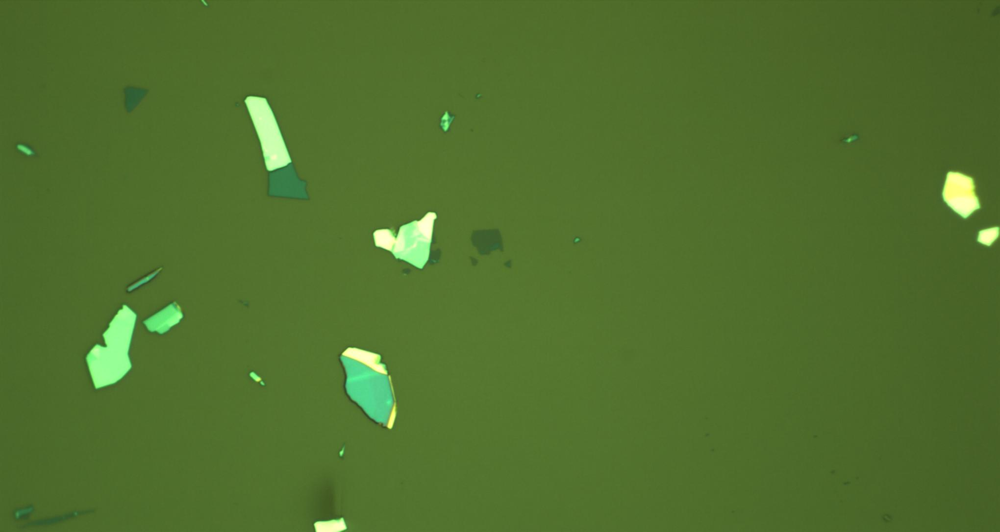

load checkpoint from local path: /content/epoch18/epoch_18.pth


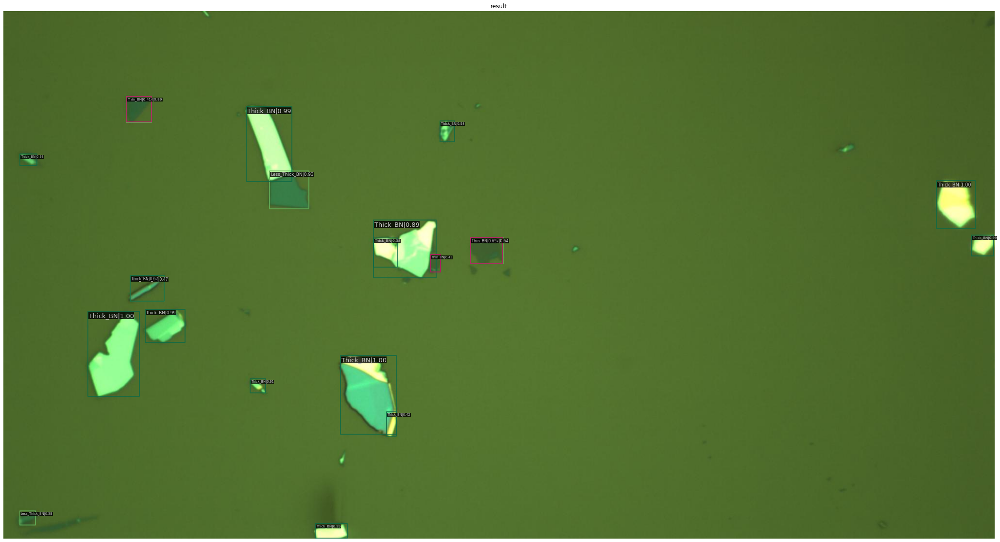

In [ ]:
# Inference detection on a sample image from Masubuchi
image=mmcv.imread('/content/cjlyhoo9awjqq0714crlf57db%2F0db84a13-81ed-21e5-6098-ed387a64220b-0000000192_-000013067_0000012250_0000001497.jpg')
cv2_imshow(image)

model = init_detector(cfg, load_path, device='cuda:0')
result = inference_detector(model, image)
show_result_pyplot(model, image, result) 

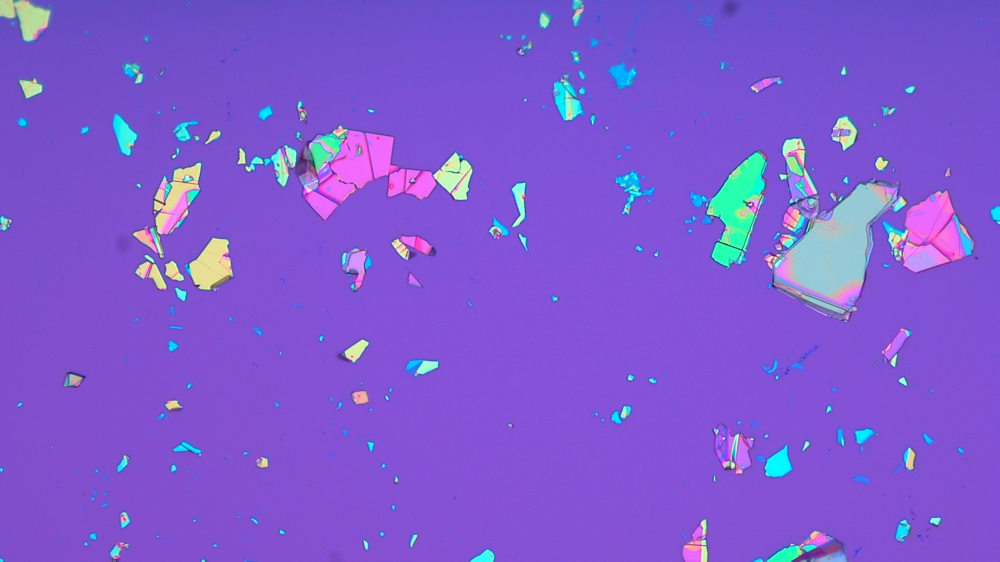

load checkpoint from local path: /content/epoch18/epoch_18.pth


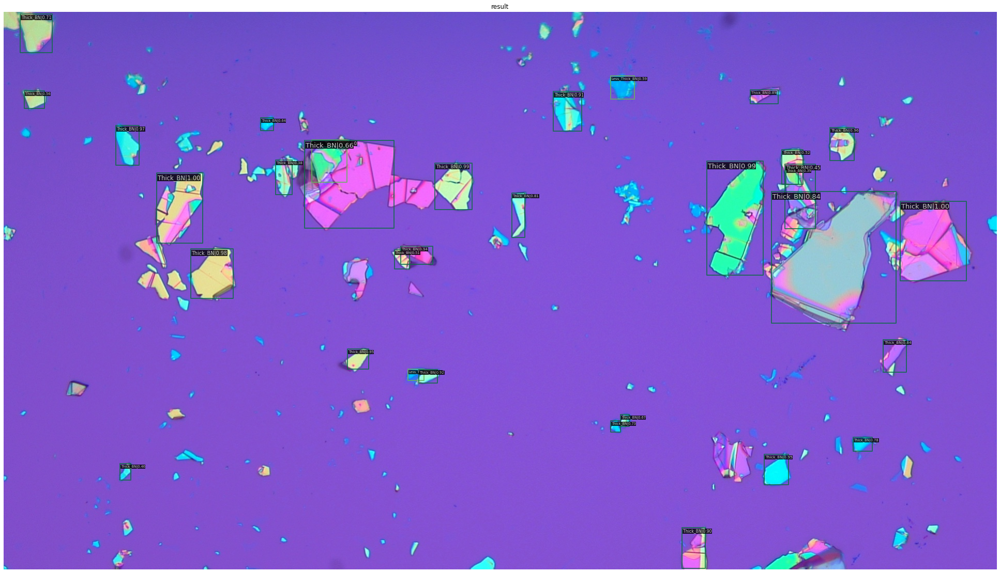

In [ ]:
# Inference detection on a sample image from UA
image=mmcv.imread('/content/3-081.jpg')
cv2_imshow(image)

model = init_detector(cfg, load_path, device='cuda:0')
result = inference_detector(model, image)
show_result_pyplot(model, image, result) 

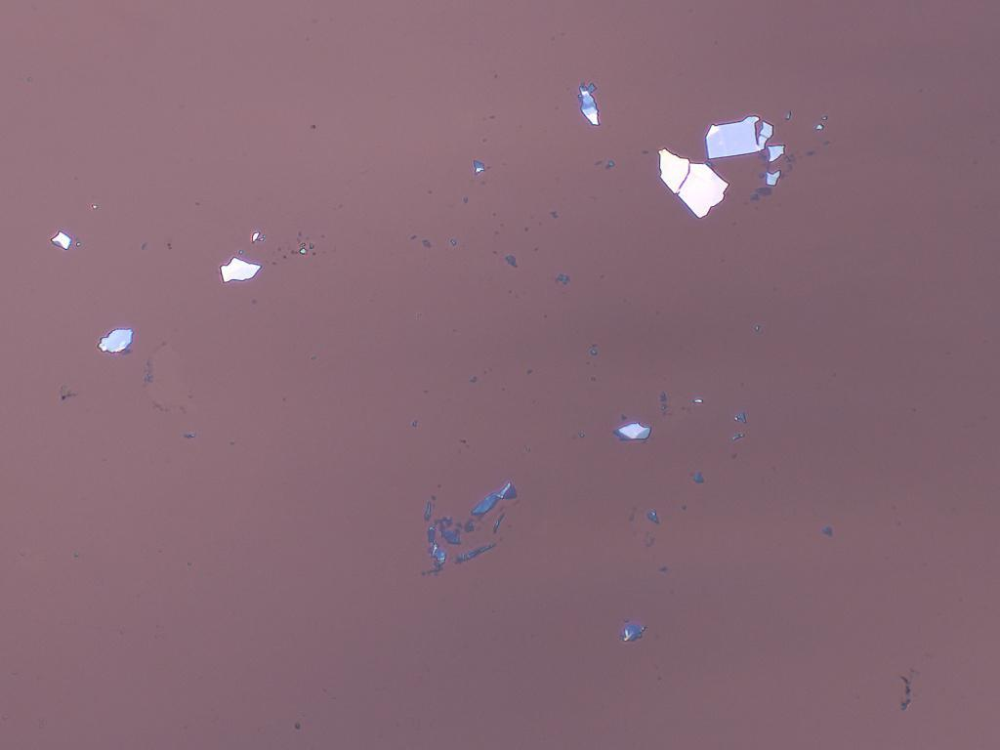

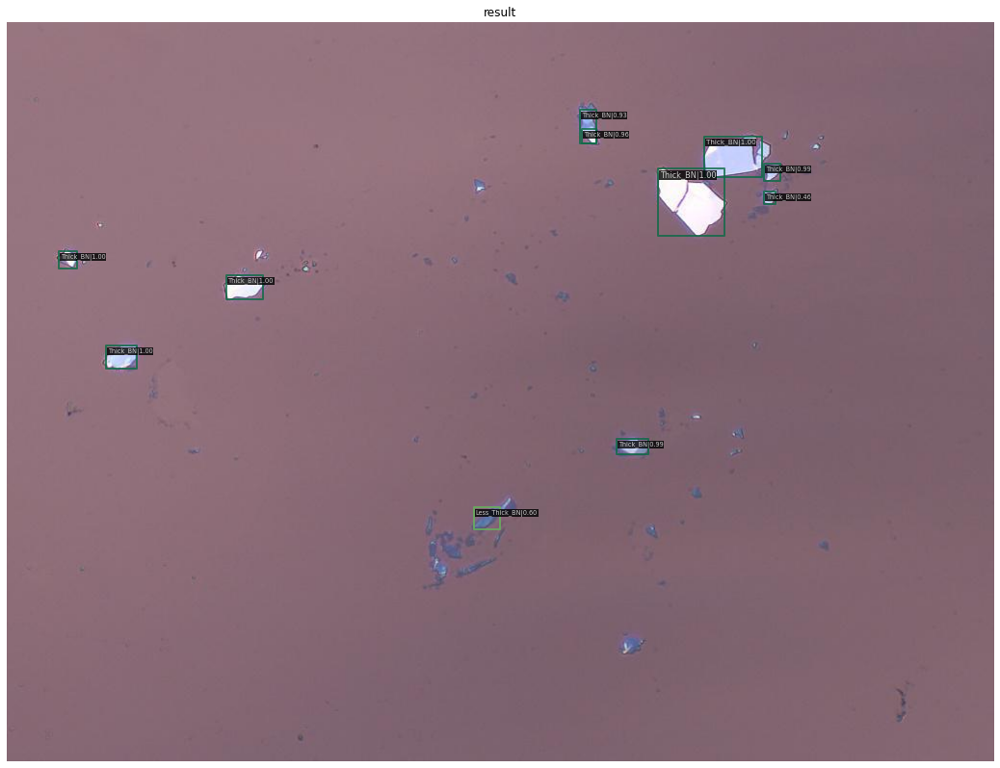

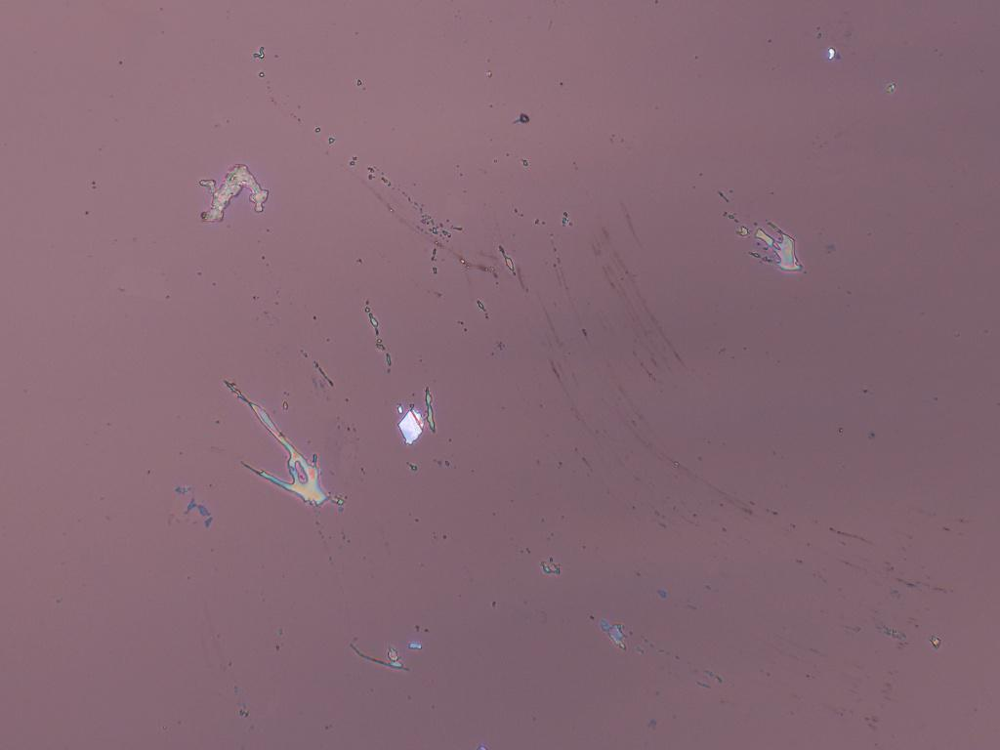

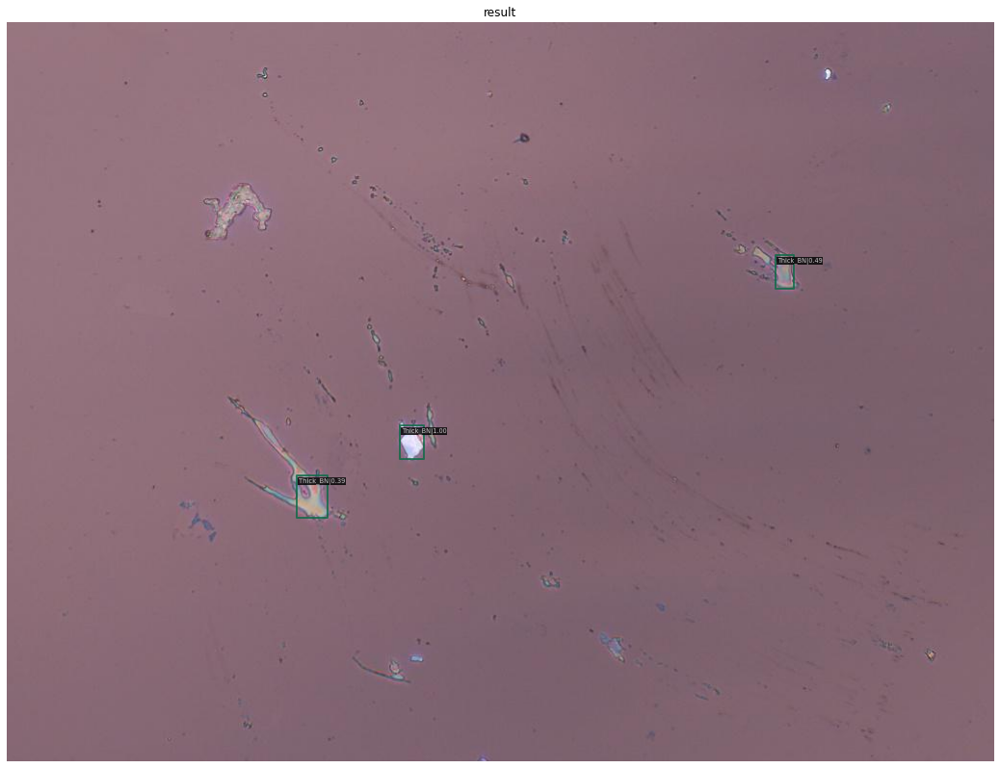

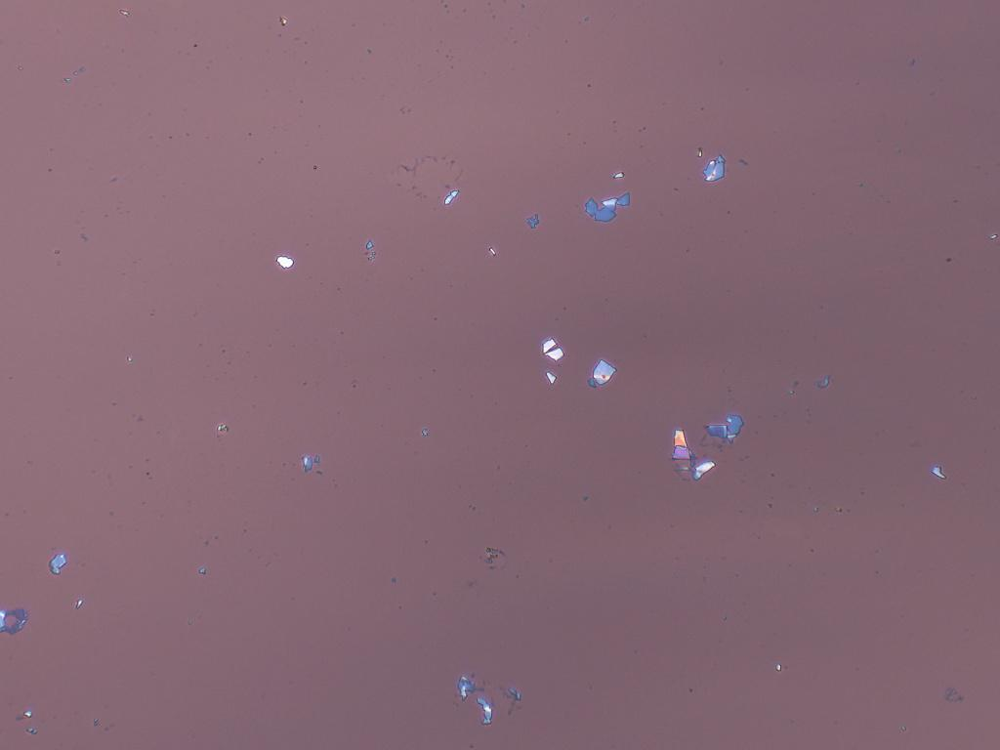

...

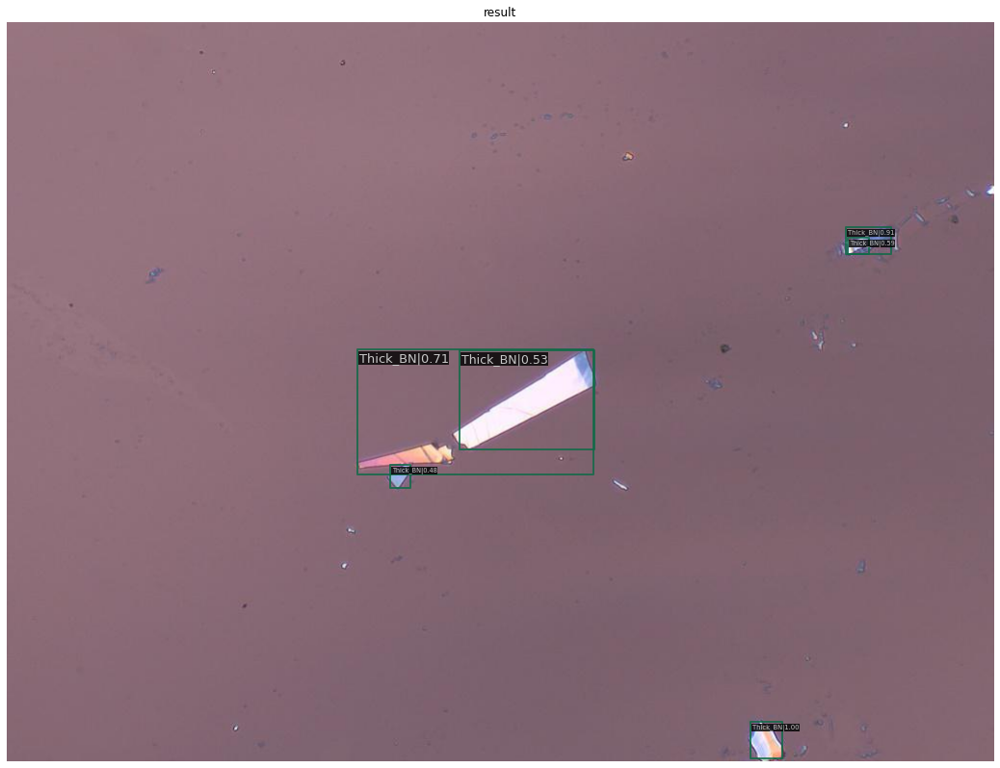

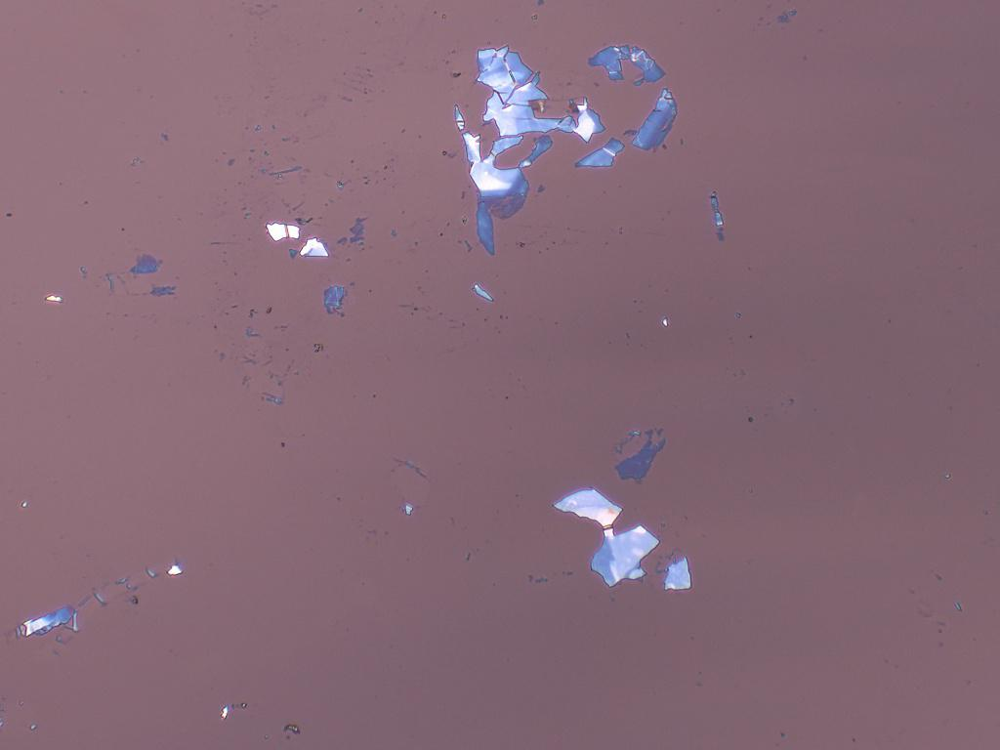

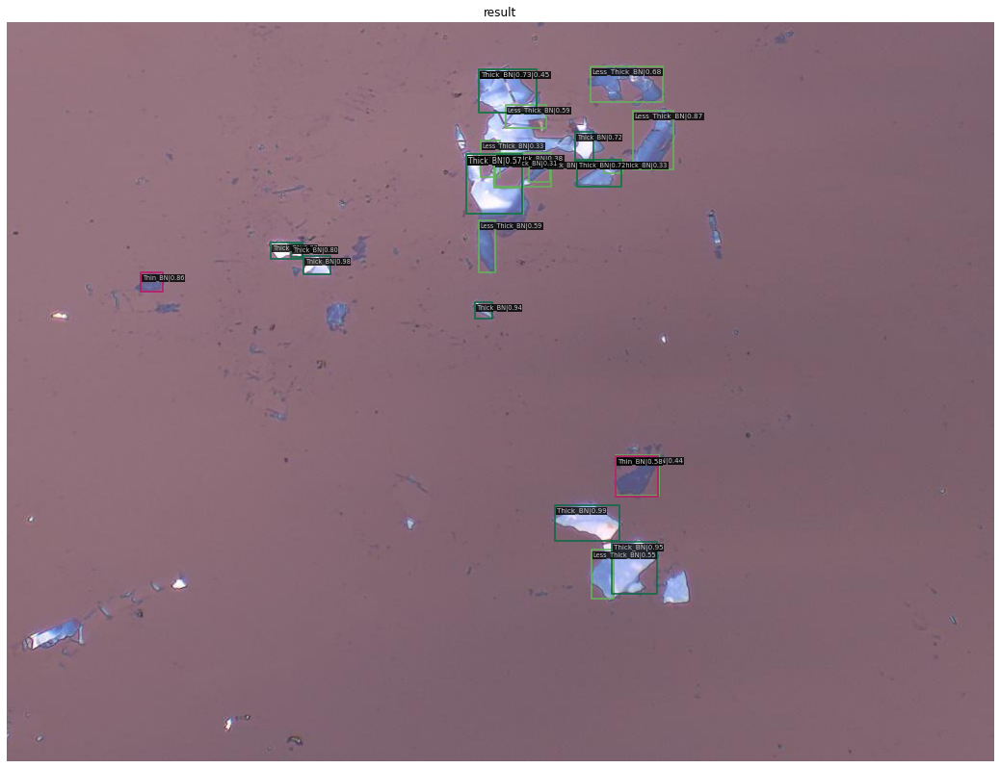

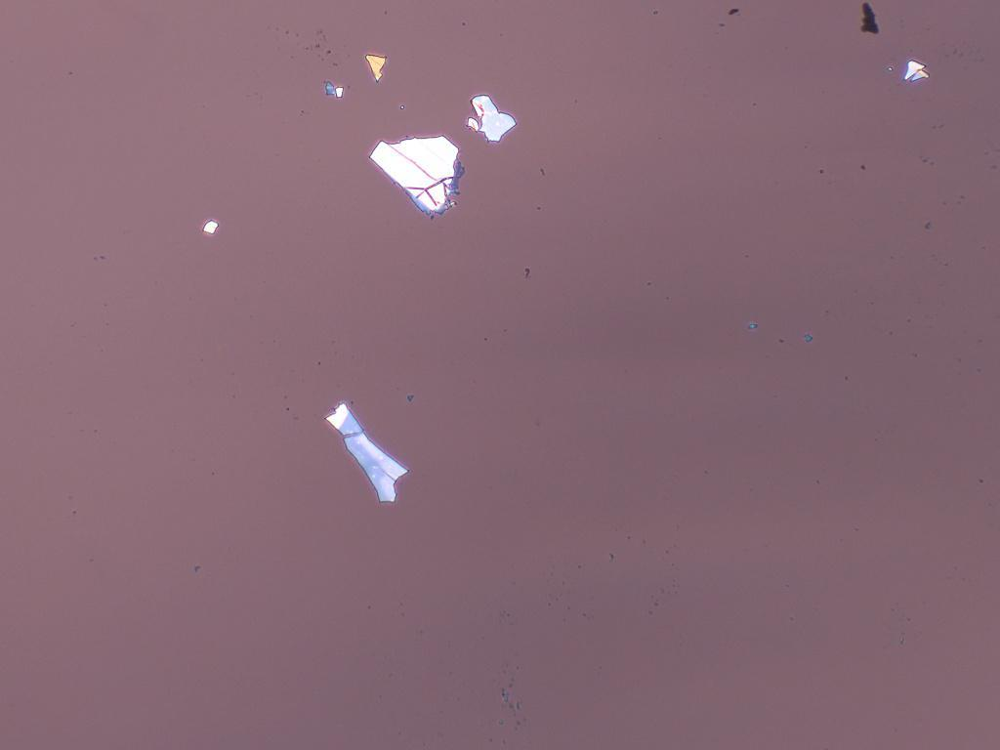

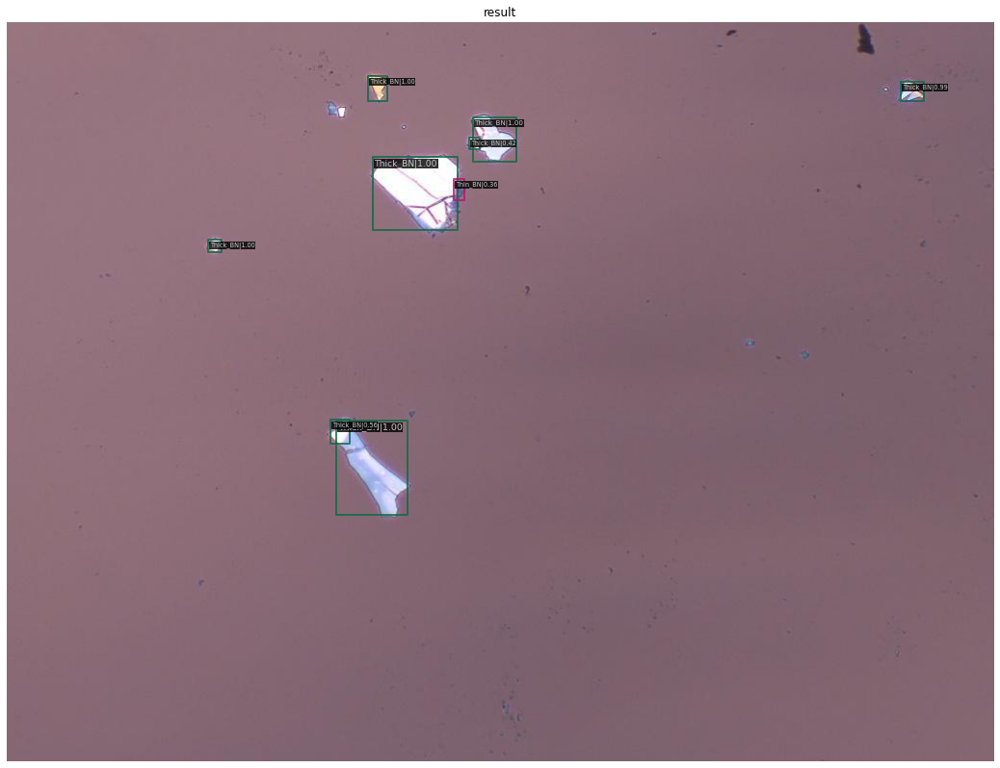

In [ ]:
# Run segmentation detection for bunch of images; visualiing the images as well as the results of detection on them

from mmdet.apis import init_detector, inference_detector, show_result_pyplot
from google.colab.patches import cv2_imshow
from skimage.io import imread_collection

cfg = Config.fromfile(config_path)  


model.CLASSES # see the classes

model.cfg = cfg

# model = init_detector(config_file, checkpoint_file, device='cuda:0') #loading the model> here i should be able to choose the specific checkpoint (epoch)


# path to the images
col_dir = '/content/sample_data/our_data/test/*.jpg'
#creating a collection with the available images
col = imread_collection(col_dir)
results_test=[] # save the results in this file (it has the same data as results.pkl when you load it)
for i in range(len(col)):
    # image=col[i]
    name=col.files[i]
    # name=name.split("test/") # reading the name of the image
    # output_name=name[1]
    image=mmcv.imread(name)
    cv2_imshow(image)
    result = inference_detector(model, image)
    results_test.append(result)
    show_result_pyplot(model, image, result)   # We can  add threshold here to filter boxes, or out_file (str or None) which is the path to write the image.